<a href="https://colab.research.google.com/github/yonggarigari/-Intel-Edge-AI-SW/blob/main/transferlearning0131.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tflite-runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 32.3 MB/s eta 0:00:00


Selected model: effNet_v2_1k_b0_fv_v2 : https://www.kaggle.com/models/google/efficientnet-v2/frameworks/TensorFlow2/variations/imagenet1k-b0-feature-vector/versions/2
Input size (224, 224), Output feature vector size 1280


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.1.incomplete7X9NK5/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmpuk7ryv6wtfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-in

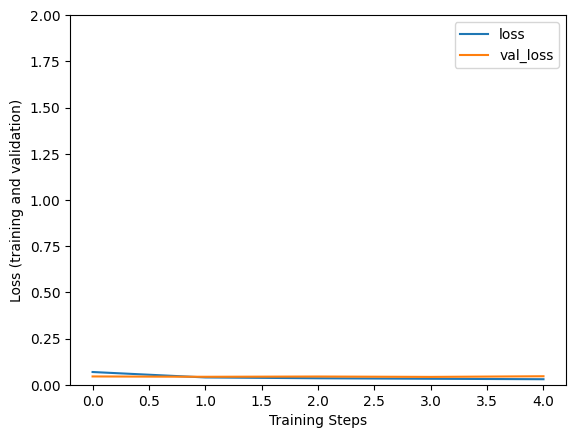

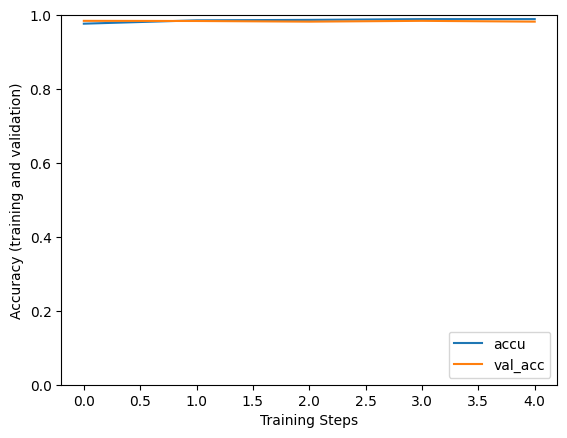

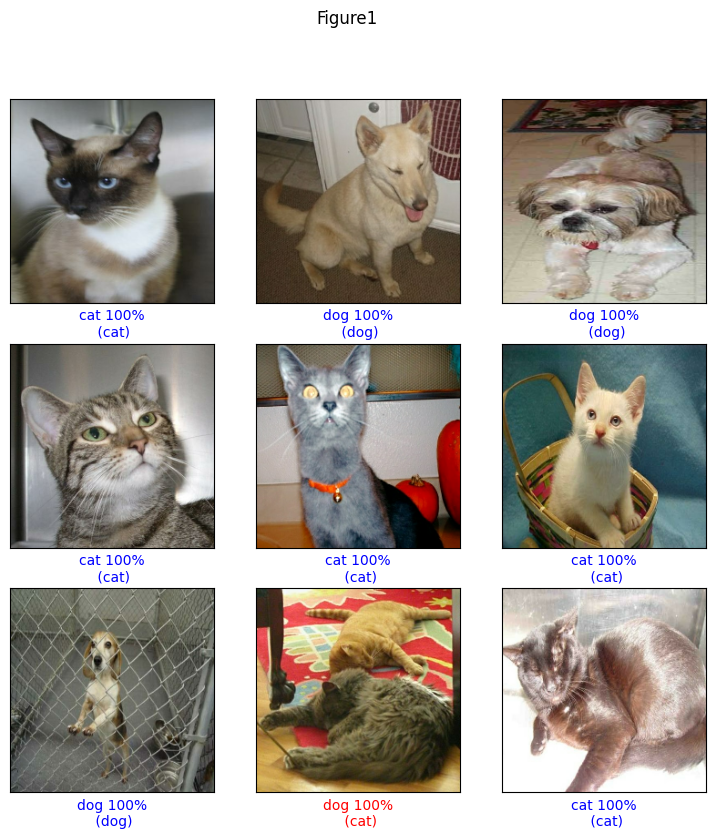

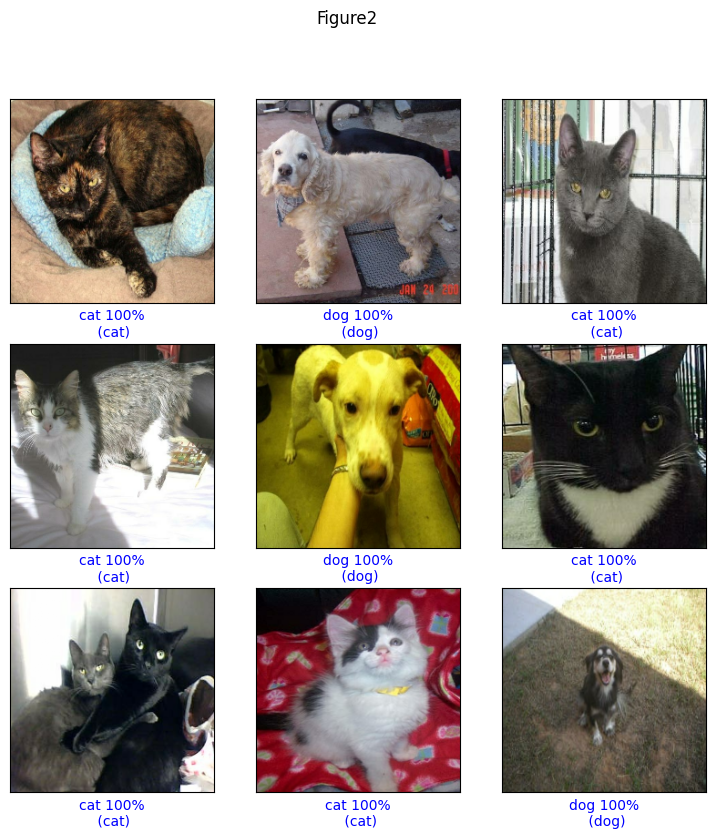

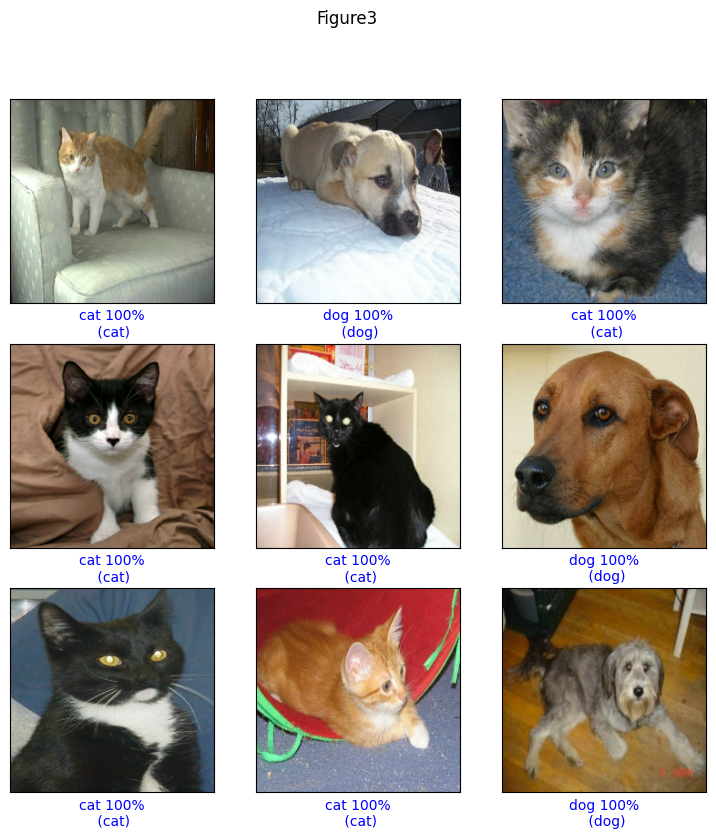

...

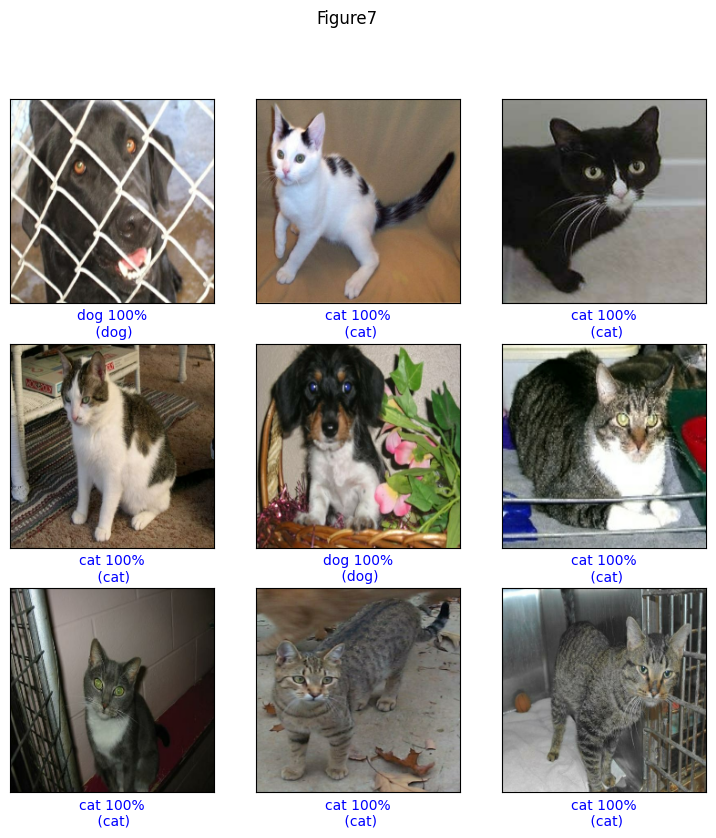

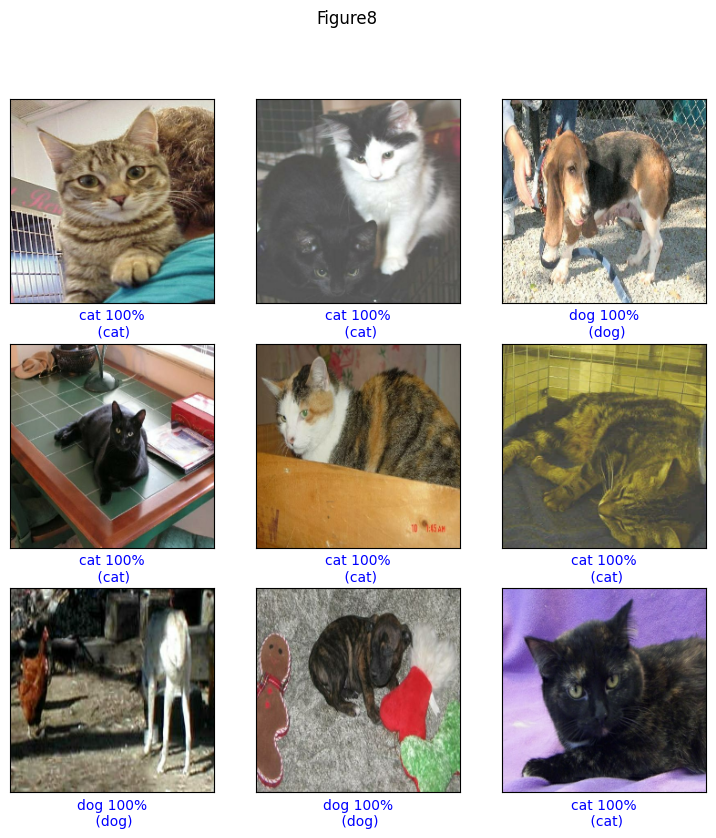

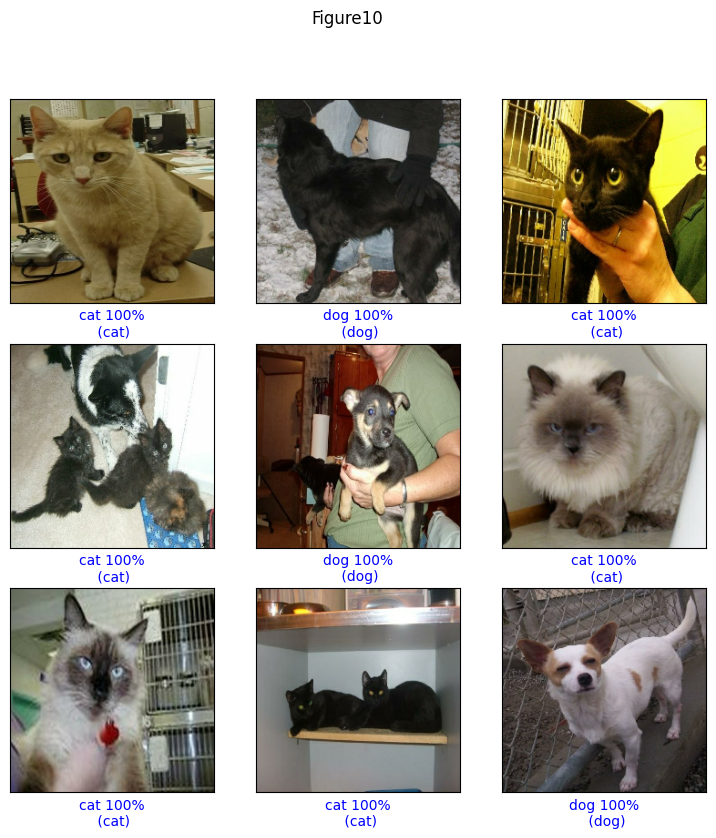

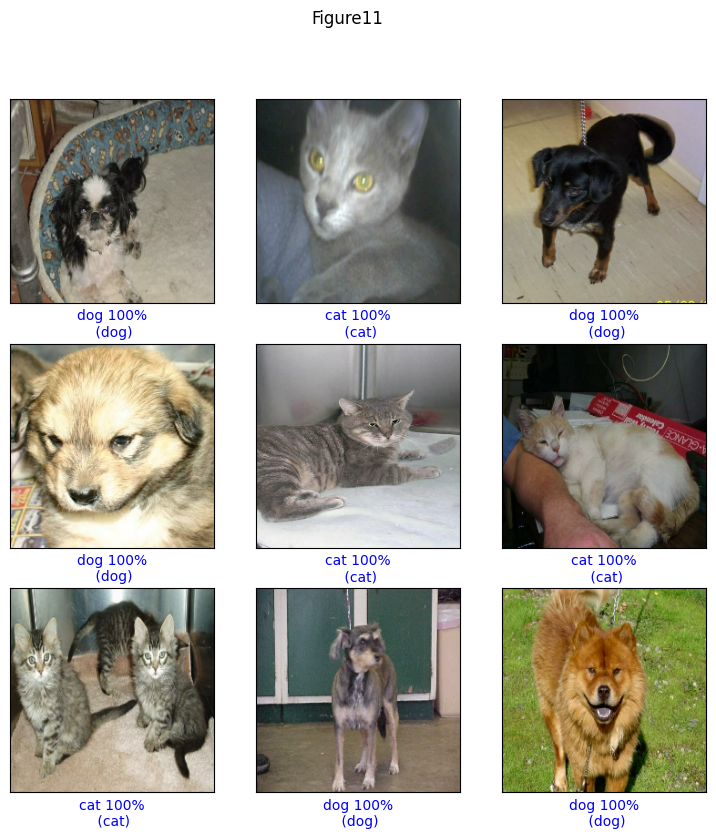

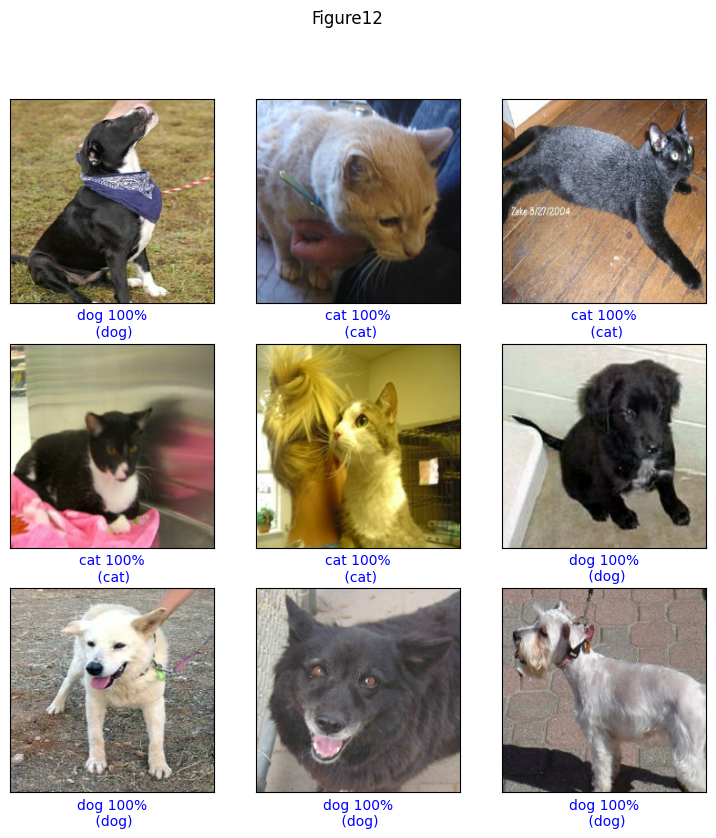

In [ ]:
###############################
# cats vs dog
# EFFICIENT NET
# https://www.kaggle.com/models/google/efficientnet-v2/frameworks/TensorFlow2/variations/imagenet1k-b0-feature-vector/versions/2
################################

import numpy as np
import matplotlib.pylab as plt
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import tflite_runtime.interpreter as tflite


###########전이학습을 위한 이미지 특성 벡터 생성하는 모델 선택하기##########
handle_base_name = "effNet_v2_1k_b0_fv_v2" # @param ['mobilenet_v2_tf2_pre_fv_v4', 'mobilenet_v2_140_224_v2', 'effNet_v2_1k_b0_fv_v2']

#링크
handle_base_map = {
  "mobilenet_v2_tf2_pre_fv_v4": "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/tf2-preview-feature-vector/versions/4",
  "mobilenet_v2_140_224_v2": "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2",
  "effNet_v2_1k_b0_fv_v2": "https://www.kaggle.com/models/google/efficientnet-v2/frameworks/TensorFlow2/variations/imagenet1k-b0-feature-vector/versions/2",
}

#인풋 이미지 사이즈 크기
handle_base_image_size_map = {
  "mobilenet_v2_tf2_pre_fv_v4": 224,
  "mobilenet_v2_140_224_v2": 224,
  "effNet_v2_1k_b0_fv_v2": 224,
}

#아웃풋 FEATURE VECTOR SIZE
handle_base_output_map ={
  "mobilenet_v2_tf2_pre_fv_v4":1280,
  "mobilenet_v2_140_224_v2": 1792,
  "effNet_v2_1k_b0_fv_v2": 1280

}

model_handle = handle_base_map.get(handle_base_name)
pixels = handle_base_image_size_map.get(handle_base_name, 224) #(2번째 파라미터는 해당 모델이 없을 시, 디폴트값
feature_vector_size = handle_base_output_map.get(handle_base_name)
IMAGE_SIZE = (pixels, pixels)

print(f"Selected model: {handle_base_name} : {model_handle}")
print(f"Input size {IMAGE_SIZE}, Output feature vector size {feature_vector_size}")

feature_extractor = hub.KerasLayer(
    model_handle,
    input_shape = IMAGE_SIZE +(3,),
    output_shape = [feature_vector_size],
    trainable = False
)
BATCH_SIZE = 32


##########데이터세트 설정하기 (모델에 맞게 이미지 조정)##########
#244x 244 사이즈로 리사이즈를 하고, 정규화를 해줍니다.
def format_image(image,label):
    image = tf.image.resize(image,(224,224))/255.0
    return image, label

#훈련, 검증, 테스트 세트로 나눕니다.
(raw_train, raw_validation, raw_test), metadata =tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]','train[80%:90%]','train[90%:]'],
    with_info=True,
    as_supervised=True,
)

print(metadata)

num_examples = metadata.splits['train'].num_examples
num_classes = metadata.features['label'].num_classes
class_names = metadata.features['label'].names

train_batches = raw_train.shuffle(num_examples//4).map(format_image).batch(BATCH_SIZE).prefetch(1)
validation_batches = raw_validation.map(format_image).batch(BATCH_SIZE).prefetch(1)
test_batches = raw_test.map(format_image).batch(1)


##########모델 정의하기#############
model = tf.keras.Sequential([
    feature_extractor,
    tf.keras.layers.Dense(num_classes, activation ='softmax')
])

model.compile(
    optimizer='adam',
    loss ='sparse_categorical_crossentropy',
    metrics =['accuracy']
)

hist = model.fit(
    train_batches,
    epochs = 5,
    validation_data = validation_batches
).history

model.summary()

#트레이닝 결과 그래프 보여주기
plt.figure()
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,2])
plt.plot(hist["loss"],label='loss')
plt.plot(hist["val_loss"],label='val_loss')
plt.legend(loc='upper right')

plt.figure()
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(hist["accuracy"],label='accu')
plt.plot(hist["val_accuracy"],label='val_acc')
plt.legend(loc='lower right')

#학습된 모델 저장하기
_SAVED_MODEL = "/content/drive/MyDrive/INTEL_PYTHON/effNET_exp_saved_model"
tf.saved_model.save(model, _SAVED_MODEL)

#tensoflow lite로 변환하기
converter = tf.lite.TFLiteConverter.from_saved_model(_SAVED_MODEL)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()
tflite_model_file = '/content/drive/MyDrive/INTEL_PYTHON/effNET_converted_model.tflite'

#with open(…) as f 에서 f는 open(…)함수가 리턴한 file object.
with open(tflite_model_file, "wb") as f:
  f.write(tflite_model)

###########################
## 라즈베리 파이에서 실행할 추론 코드
###########################

#모델 로드
interpreter = tflite.Interpreter(model_path='/content/drive/MyDrive/INTEL_PYTHON/effNET_converted_model.tflite')

#텐서 할당
interpreter.allocate_tensors()
input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

input_details = interpreter.get_input_details()[0]
print('input: ', input_details)
output_details = interpreter.get_output_details()[0]
print('output: ', output_details)

predictions =[]

#테스트 데이터로 추론하기
predictions =[]
test_labels, test_imgs = [],[]
for img, label in test_batches.take(100):
    interpreter.set_tensor(input_index, img)
    interpreter.invoke()
    predictions.append(interpreter.get_tensor(output_index))
    test_labels.append(label.numpy()[0])
    test_imgs.append(img)

#추론 결과 확인하기
score  = 0
for item in range(0,100):
    prediction = np.argmax(predictions[item])
    label = test_labels[item]
    if prediction == label:
        score = score +1

print("100개 중 맞은 예측 수: "+ str(score))

def plot_image(i, predictions_array, true_label, img):
    true_label, img = true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.squeeze(img)
    plt.imshow(img)

    predicted_label = np.argmax(predictions_array[i])
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}%\n ({})".format(class_names[predicted_label],
                                    100*np.max(predictions_array),
                                    class_names[true_label]),
                                    color=color)


for index in range(0,99):
    match (index%9):
        case (0):
            plt.figure(figsize=(9,9))
            plt.subplot(331)
        case (1):
            plt.subplot(332)
        case (2):
            plt.subplot(333)
        case (3):
            plt.subplot(334)
        case (4):
            plt.subplot(335)
        case (5):
            plt.subplot(336)
        case (6):
            plt.subplot(337)
        case (7):
            plt.subplot(338)
        case (8):
            plt.subplot(339)
            plot_image(index, predictions, test_labels, test_imgs)
            plt.suptitle('Figure{}'.format(int(index/8)))
            #plt.savefig('resultImg/result{}.png'.format(int(i/8)))
            continue
    plot_image(index, predictions, test_labels, test_imgs)
# for index in range(0,99):
#     if index%2 == 0 :
#       plt.figure(figsize = (6,3))
#       plt.subplot(121)
#     elif index %2 ==1 :
#       plt.subplot(122)

#     plot_image(index, predictions, test_labels, test_imgs)
#       #imgFile = 'resultImg/result{}.png'.format(index)
#       #plt.savefig(imgFile)




Selected model: mobilenet_v2_140_224_v2 : https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2
Input size (224, 224), Output feature vector size 1792


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/27000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/eurosat/rgb/2.0.0.incomplete5N2UK8/eurosat-train.tfrecord*...:   0%|      …

Dataset eurosat downloaded and prepared to /root/tensorflow_datasets/eurosat/rgb/2.0.0. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='eurosat',
    full_name='eurosat/rgb/2.0.0',
    description="""
    EuroSAT dataset is based on Sentinel-2 satellite images covering 13 spectral
    bands and consisting of 10 classes with 27000 labeled and
    geo-referenced samples.
    
    Two datasets are offered:
    - rgb: Contains only the optical R, G, B frequency bands encoded as JPEG image.
    - all: Contains all 13 bands in the original value range (float32).
    
    URL: https://github.com/phelber/eurosat
    """,
    config_description="""
    Sentinel-2 RGB channels
    """,
    homepage='https://github.com/phelber/eurosat',
    data_dir=PosixGPath('/tmp/tmp03jp5beitfds'),
    file_format=tfrecord,
    download_size=89.91 MiB,
    dataset_size=89.50 MiB,
    features=FeaturesDict({
        'filename': Text(shape=(), dtype=string),
        'image': Image(shape=(

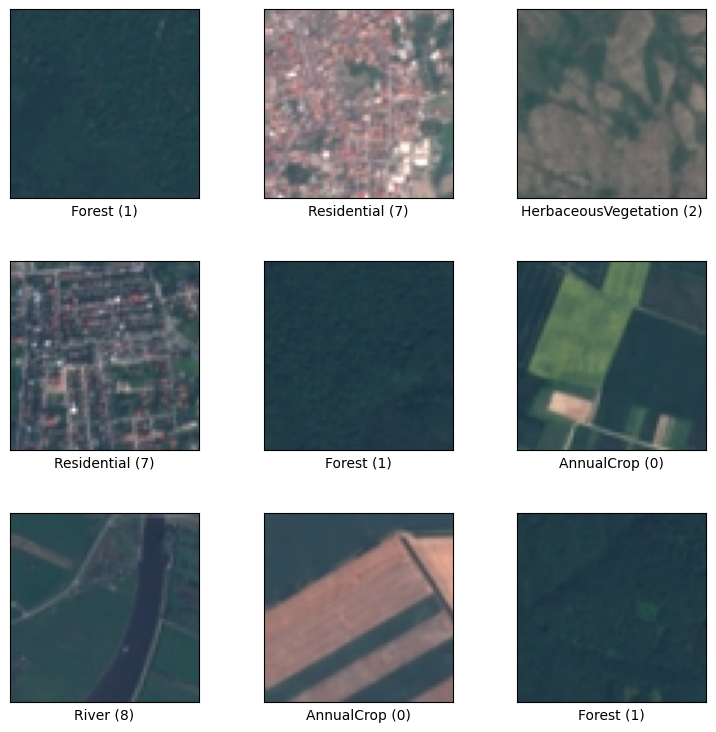

Epoch 1/10
720/720 [==============================] - 58s 67ms/step - loss: 0.2740 - accuracy: 0.9157 - val_loss: 0.1626 - val_accuracy: 0.9470
Epoch 2/10
720/720 [==============================] - 41s 57ms/step - loss: 0.1277 - accuracy: 0.9573 - val_loss: 0.1544 - val_accuracy: 0.9459
Epoch 3/10
720/720 [==============================] - 40s 55ms/step - loss: 0.0980 - accuracy: 0.9674 - val_loss: 0.1422 - val_accuracy: 0.9537
Epoch 4/10
720/720 [==============================] - 39s 54ms/step - loss: 0.0809 - accuracy: 0.9750 - val_loss: 0.1340 - val_accuracy: 0.9541
Epoch 5/10
720/720 [==============================] - 38s 53ms/step - loss: 0.0666 - accuracy: 0.9790 - val_loss: 0.1463 - val_accuracy: 0.9526
Epoch 6/10
720/720 [==============================] - 41s 56ms/step - loss: 0.0565 - accuracy: 0.9831 - val_loss: 0.1637 - val_accuracy: 0.9493
Epoch 7/10
720/720 [==============================] - 40s 55ms/step - loss: 0.0489 - accuracy: 0.9863 - val_loss: 0.1473 - val_accuracy:

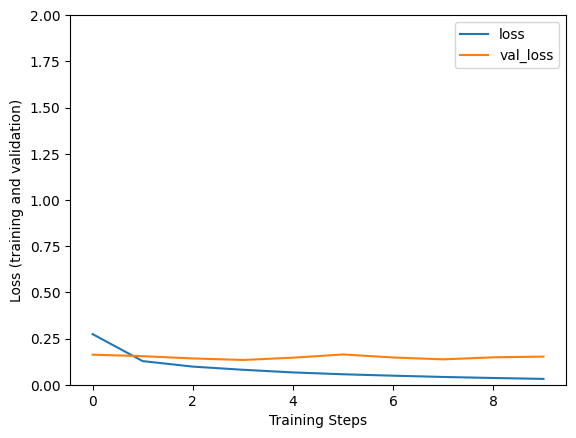

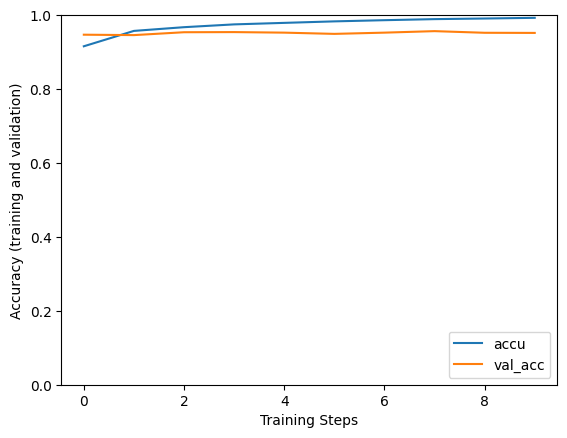

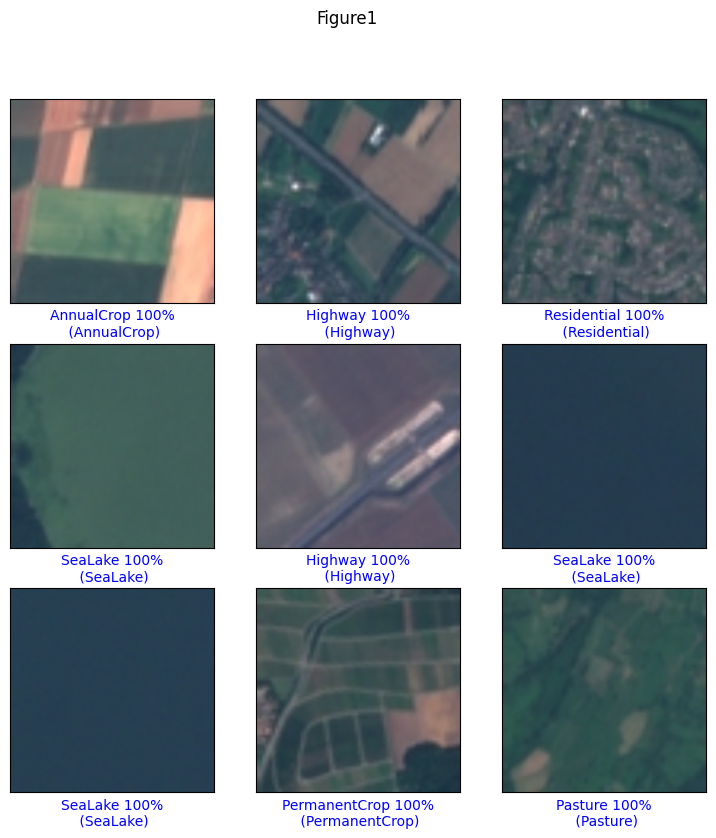

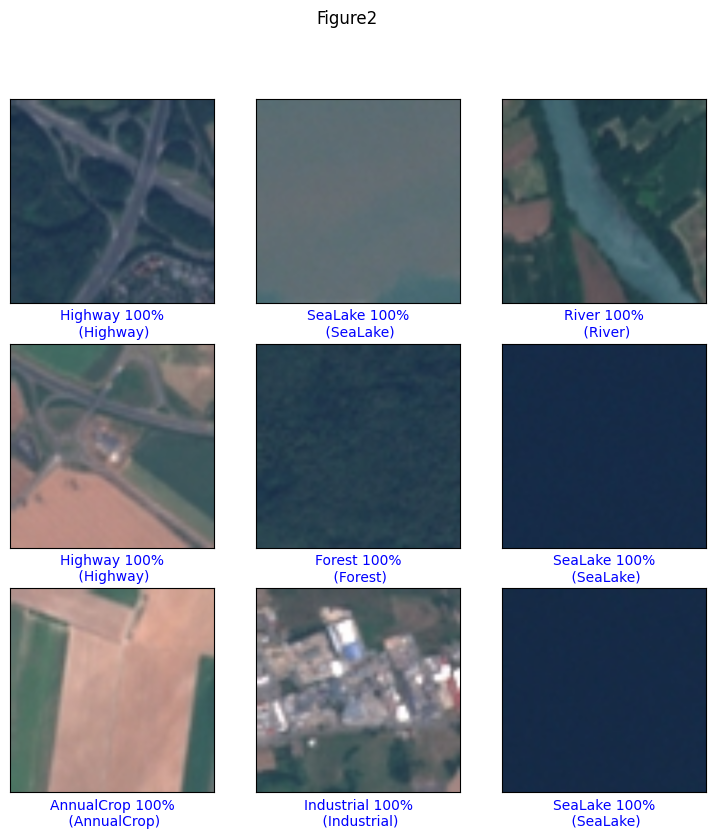

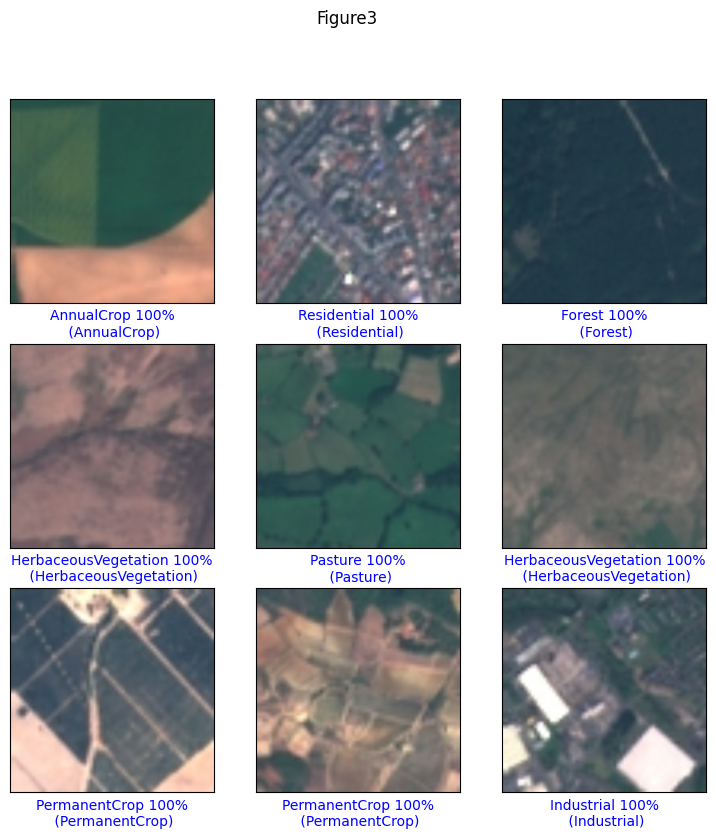

...

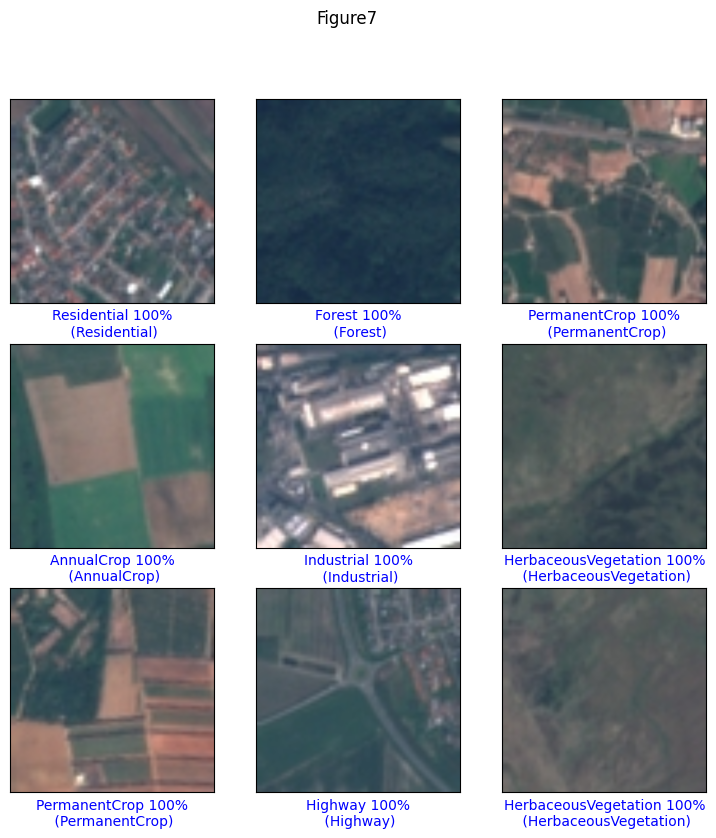

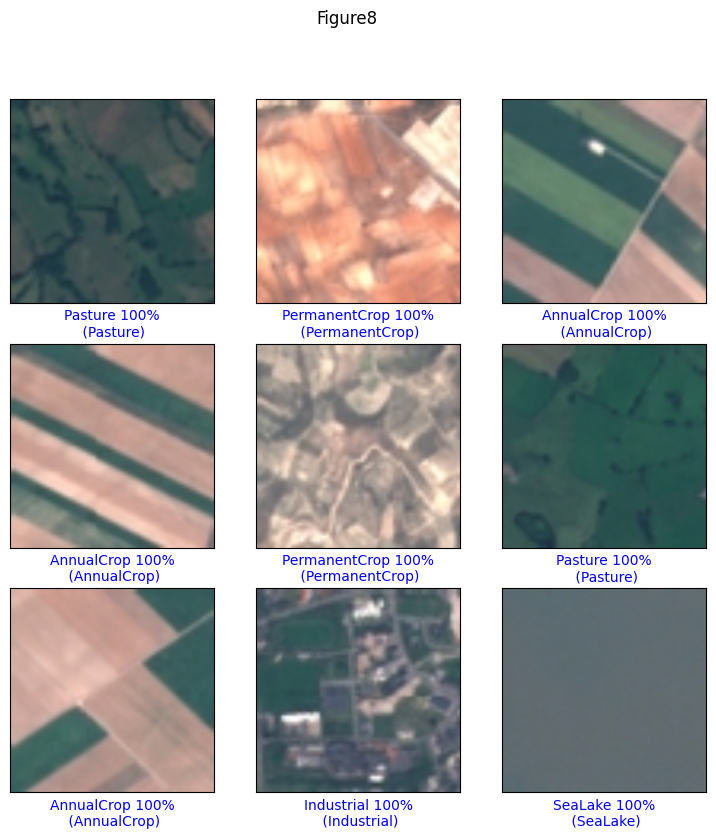

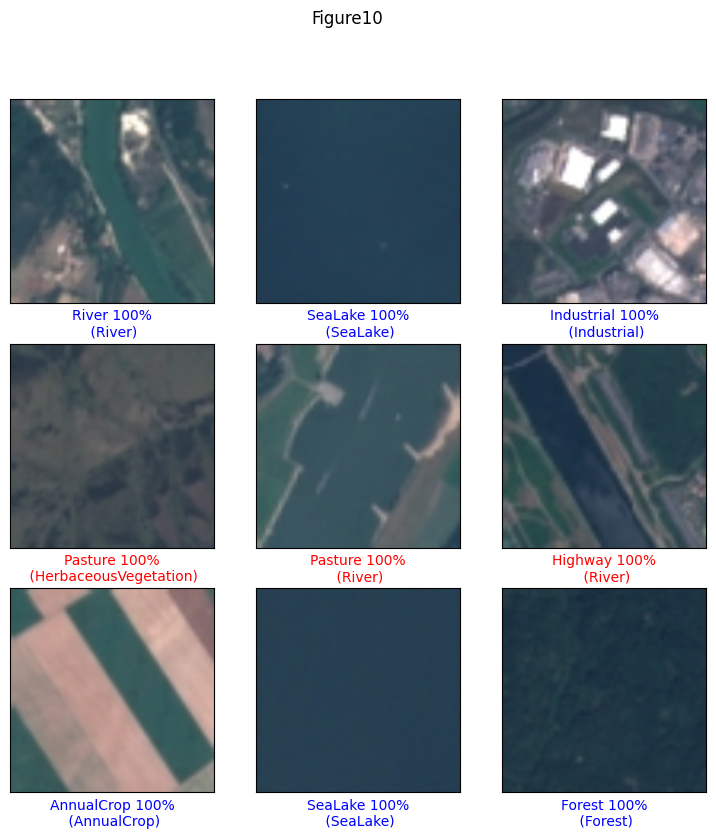

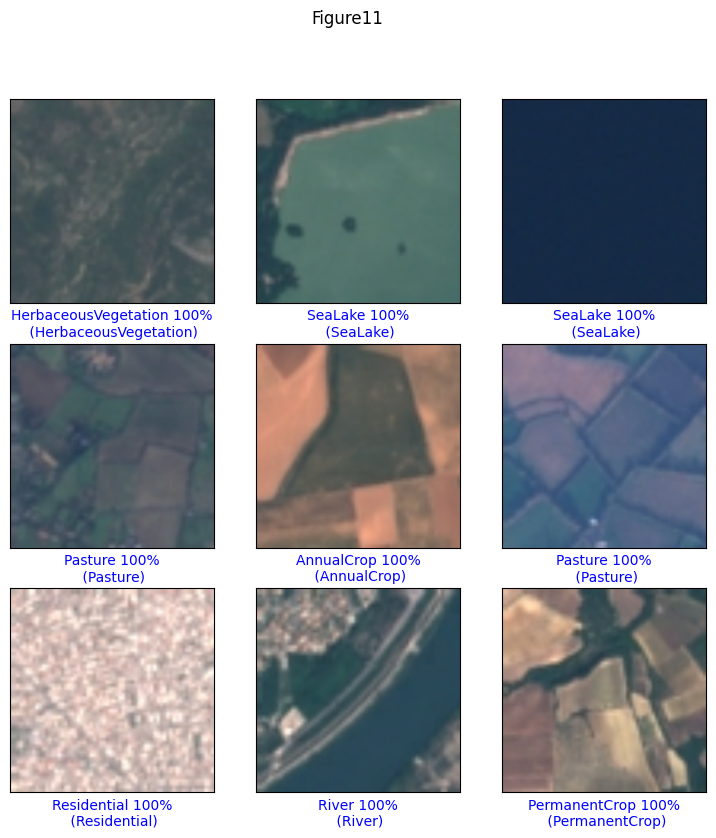

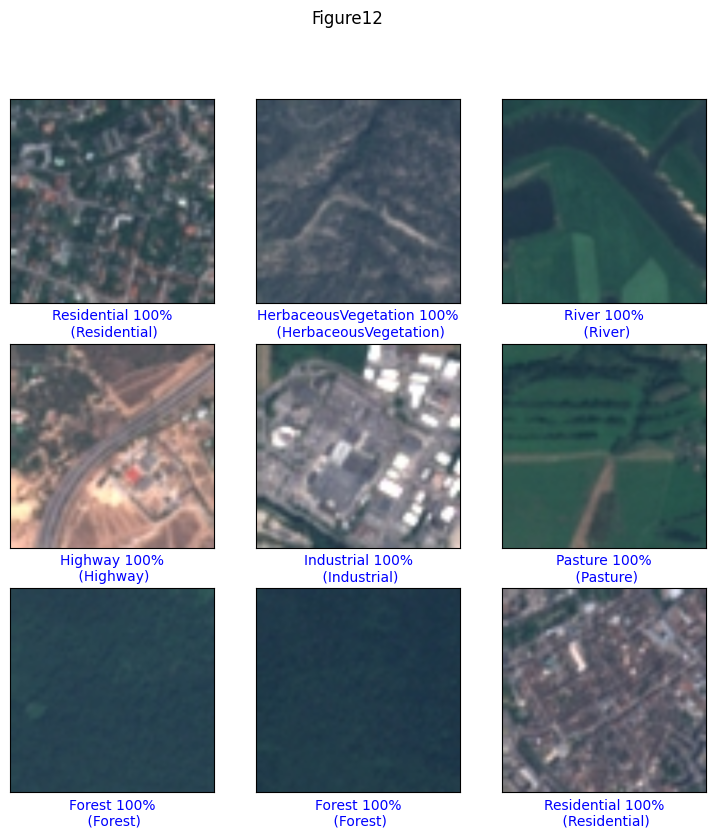

In [ ]:
###############################
## eurosat
#mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2
################################

import numpy as np
import matplotlib.pylab as plt
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import tflite_runtime.interpreter as tflite


###########전이학습을 위한 이미지 특성 벡터 생성하는 모델 선택하기##########
handle_base_name = "mobilenet_v2_140_224_v2" # @param ['mobilenet_v2_tf2_pre_fv_v4', 'mobilenet_v2_140_224_v2', 'effNet_v2_1k_b0_fv_v2']

#링크
handle_base_map = {
  "mobilenet_v2_tf2_pre_fv_v4": "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/tf2-preview-feature-vector/versions/4",
  "mobilenet_v2_140_224_v2": "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2",
  "effNet_v2_1k_b0_fv_v2": "https://www.kaggle.com/models/google/efficientnet-v2/frameworks/TensorFlow2/variations/imagenet1k-b0-feature-vector/versions/2",
}

#인풋 이미지 사이즈 크기
handle_base_image_size_map = {
  "mobilenet_v2_tf2_pre_fv_v4": 224,
  "mobilenet_v2_140_224_v2": 224,
  "effNet_v2_1k_b0_fv_v2": 224,
}

#아웃풋 FEATURE VECTOR SIZE
handle_base_output_map ={
  "mobilenet_v2_tf2_pre_fv_v4":1280,
  "mobilenet_v2_140_224_v2": 1792,
  "effNet_v2_1k_b0_fv_v2": 1280

}

model_handle = handle_base_map.get(handle_base_name)
pixels = handle_base_image_size_map.get(handle_base_name, 224) #(2번째 파라미터는 해당 모델이 없을 시, 디폴트값
feature_vector_size = handle_base_output_map.get(handle_base_name)
IMAGE_SIZE = (pixels, pixels)

print(f"Selected model: {handle_base_name} : {model_handle}")
print(f"Input size {IMAGE_SIZE}, Output feature vector size {feature_vector_size}")

feature_extractor = hub.KerasLayer(
    model_handle,
    input_shape = IMAGE_SIZE +(3,),
    output_shape = [feature_vector_size],
    trainable = False
)
BATCH_SIZE = 30

##########데이터세트 설정하기 (모델에 맞게 이미지 조정)##########
#244x 244 사이즈로 리사이즈를 하고, 정규화를 해줍니다.
def format_image(image,label):
    image = tf.image.resize(image,(224,224))/255.0
    return image, label

#훈련, 검증, 테스트 세트로 나눕니다.
(raw_train, raw_validation, raw_test), metadata =tfds.load(
    'eurosat',
    split=['train[:80%]','train[80%:90%]','train[90%:]'],
    with_info=True,
    as_supervised=True,
)

print(metadata)

num_examples = metadata.splits['train'].num_examples
num_classes = metadata.features['label'].num_classes
class_names =metadata.features['label'].names
print(class_names)

fig = tfds.show_examples(raw_train, metadata)

train_batches = raw_train.shuffle(num_examples//4).map(format_image).batch(BATCH_SIZE).prefetch(1)
validation_batches = raw_validation.map(format_image).batch(BATCH_SIZE).prefetch(1)
test_batches = raw_test.map(format_image).batch(1)

##########모델 정의하기#############

model = tf.keras.Sequential([
    feature_extractor,
    tf.keras.layers.Dense(num_classes, activation ='softmax')
])

model.compile(
    optimizer='adam', #sgd 사용하지 말것
    loss ='sparse_categorical_crossentropy',
    metrics =['accuracy']
)

hist = model.fit(
    train_batches,
    epochs = 10,
    validation_data = validation_batches
).history

model.summary()

#트레이닝 결과 그래프 보여주기
plt.figure()
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,2])
plt.plot(hist["loss"],label='loss')
plt.plot(hist["val_loss"],label='val_loss')
plt.legend(loc='upper right')


plt.figure()
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(hist["accuracy"],label='accu')
plt.plot(hist["val_accuracy"],label='val_acc')
plt.legend(loc='lower right')

#학습된 모델 저장하기
_SAVED_MODEL = "/content/drive/MyDrive/INTEL_PYTHON/eurosat140_224_saved_model"
tf.saved_model.save(model, _SAVED_MODEL)

#tensoflow lite로 변환하기
converter = tf.lite.TFLiteConverter.from_saved_model(_SAVED_MODEL)
converter.optimizations = [tf.lite.Optimize.DEFAULT] #최적화
tflite_model = converter.convert()
tflite_model_file = '/content/drive/MyDrive/INTEL_PYTHON/eurosat140_224_converted_model.tflite'

#with open(…) as f 에서 f는 open(…)함수가 리턴한 file object.
with open(tflite_model_file, "wb") as f:
  f.write(tflite_model)


###########################
## 라즈베리 파이에서 실행할 추론 코드
###########################

interpreter = tflite.Interpreter(model_path='/content/drive/MyDrive/INTEL_PYTHON/eurosat140_224_converted_model.tflite')

#텐서 할당
interpreter.allocate_tensors()
input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

#input, output 텐서 정보 확인
input_details = interpreter.get_input_details()[0]
print('input: ', input_details)
output_details = interpreter.get_output_details()[0]
print('output: ', output_details)

predictions =[]

# print(input_index)
# print(output_index)

#테스트 데이터로 추론하기
predictions =[]
test_labels, test_imgs = [],[]
for img, label in test_batches.take(100):
    interpreter.set_tensor(input_index, img)
    interpreter.invoke()
    predictions.append(interpreter.get_tensor(output_index))
    test_labels.append(label.numpy()[0])
    test_imgs.append(img)


#추론 결과 확인하기
score  = 0
for item in range(0,100):
    prediction = np.argmax(predictions[item])
    label = test_labels[item]
    if prediction == label:
        score = score +1

print("100개 중 맞은 예측 수: "+ str(score))

def plot_image(index, predictions_array, true_label, img):
    true_label, img = true_label[index], img[index]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.squeeze(img)
    plt.imshow(img)

    predicted_label = np.argmax(predictions_array[index])
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("{} {:2.0f}%\n ({})".format(class_names[predicted_label],
                                    100*np.max(predictions_array),
                                    class_names[true_label]),
                                    color=color)


for index in range(0,99):
    match (index%9):
        case (0):
            plt.figure(figsize=(9,9))
            plt.subplot(331)
        case (1):
            plt.subplot(332)
        case (2):
            plt.subplot(333)
        case (3):
            plt.subplot(334)
        case (4):
            plt.subplot(335)
        case (5):
            plt.subplot(336)
        case (6):
            plt.subplot(337)
        case (7):
            plt.subplot(338)
        case (8):
            plt.subplot(339)
            plot_image(index, predictions, test_labels, test_imgs)
            plt.suptitle('Figure{}'.format(int(index/8)))
            #plt.savefig('resultImg/result{}.png'.format(int(i/8)))
            continue
    plot_image(index, predictions, test_labels, test_imgs)





In [ ]:
###############################
## 말라리아 malaria
#['parasitized', 'uninfected']
#mobilenet-v2/frameworks/TensorFlow2/variations/tf2-preview-feature-vector/versions/4
################################

import numpy as np
import matplotlib.pylab as plt
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import tflite_runtime.interpreter as tflite

###########전이학습을 위한 이미지 특성 벡터 생성하는 모델 선택하기##########
handle_base_name = "mobilenet_v2_tf2_pre_fv_v4" # @param ['mobilenet_v2_tf2_pre_fv_v4', 'mobilenet_v2_140_224_v2', 'effNet_v2_1k_b0_fv_v2']

#링크
handle_base_map = {
  "mobilenet_v2_tf2_pre_fv_v4": "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/tf2-preview-feature-vector/versions/4",
  "mobilenet_v2_140_224_v2": "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2",
  "effNet_v2_1k_b0_fv_v2": "https://www.kaggle.com/models/google/efficientnet-v2/frameworks/TensorFlow2/variations/imagenet1k-b0-feature-vector/versions/2",
}

#인풋 이미지 사이즈 크기
handle_base_image_size_map = {
  "mobilenet_v2_tf2_pre_fv_v4": 224,
  "mobilenet_v2_140_224_v2": 224,
  "effNet_v2_1k_b0_fv_v2": 224,
}

#아웃풋 FEATURE VECTOR SIZE
handle_base_output_map ={
  "mobilenet_v2_tf2_pre_fv_v4":1280,
  "mobilenet_v2_140_224_v2": 1792,
  "effNet_v2_1k_b0_fv_v2": 1280

}

model_handle = handle_base_map.get(handle_base_name)
pixels = handle_base_image_size_map.get(handle_base_name, 224) #(2번째 파라미터는 해당 모델이 없을 시, 디폴트값
feature_vector_size = handle_base_output_map.get(handle_base_name)
IMAGE_SIZE = (pixels, pixels)

print(f"Selected model: {handle_base_name} : {model_handle}")
print(f"Input size {IMAGE_SIZE}, Output feature vector size {feature_vector_size}")

feature_extractor = hub.KerasLayer(
    model_handle,
    input_shape = IMAGE_SIZE +(3,),
    output_shape = [feature_vector_size],
    trainable = False
)
BATCH_SIZE = 32

##########데이터세트 설정하기 (모델에 맞게 이미지 조정)##########

#244x 244 사이즈로 리사이즈를 하고, 정규화를 해줍니다.
def format_image(image,label):
    image = tf.image.resize(image,(224,224))/255.0
    return image, label

#훈련, 검증, 테스트 세트로 나눕니다.
(raw_train, raw_validation, raw_test), metadata =tfds.load(
    'malaria',
    split=['train[:80%]','train[80%:90%]','train[90%:]'],
    with_info=True,
    as_supervised=True,
)

print(metadata)

num_examples = metadata.splits['train'].num_examples
num_classes = metadata.features['label'].num_classes
class_names =metadata.features['label'].names
print(class_names)

#train data 대표 이미지 9개 보여주기
fig = tfds.show_examples(raw_train, metadata)

train_batches = raw_train.shuffle(num_examples//4).map(format_image).batch(BATCH_SIZE).prefetch(1)
validation_batches = raw_validation.map(format_image).batch(BATCH_SIZE).prefetch(1)
test_batches = raw_test.map(format_image).batch(1)

##########모델 정의하기#############

model = tf.keras.Sequential([
    feature_extractor,
    tf.keras.layers.Dense(num_classes, activation ='softmax')
])

model.compile(
    optimizer='adam',
    loss ='sparse_categorical_crossentropy',
    metrics =['accuracy']
)

hist = model.fit(
    train_batches,
    epochs = 5,
    validation_data = validation_batches
).history

model.summary()

#트레이닝 결과 그래프 보여주기
plt.figure()
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,2])
plt.plot(hist["loss"],label='loss')
plt.plot(hist["val_loss"],label='val_loss')
plt.legend(loc='upper right')

plt.figure()
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(hist["accuracy"],label='accu')
plt.plot(hist["val_accuracy"],label='val_acc')
plt.legend(loc='lower right')

#학습된 모델 saved_model로 저장하기
#_SAVED_MODEL = "./content/drive/MyDrive/INTEL_PYTHON/malaria_saved_model"
_SAVED_MODEL = "malaria_saved_model"

tf.saved_model.save(model, _SAVED_MODEL)

# tensoflow Lite 파일 생성하기
converter = tf.lite.TFLiteConverter.from_saved_model(_SAVED_MODEL)
converter.optimizations = [tf.lite.Optimize.DEFAULT] #Dynamic Range Quantization
tflite_model = converter.convert()
tflite_model_file = 'malaria_converted_model.tflite'

#with open(…) as f 에서 f는 open(…)함수가 리턴한 file object.
with open(tflite_model_file, "wb") as f:
  f.write(tflite_model)


###########################
## 라즈베리 파이에서 실행할 추론 코드
###########################

#인터프리터 생성
interpreter = tflite.Interpreter(model_path='malaria_converted_model.tflite')

#텐서 할당
interpreter.allocate_tensors()
input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

#input, output 텐서 정보 확인
input_details = interpreter.get_input_details()[0]
print('input: ', input_details)
output_details = interpreter.get_output_details()[0]
print('output: ', output_details)

predictions =[]

# print(input_index)
# print(output_index)

#추론하기
predictions =[]
test_labels, test_imgs = [],[]
for img, label in test_batches.take(100):
    interpreter.set_tensor(input_index, img)
    interpreter.invoke()
    predictions.append(interpreter.get_tensor(output_index))
    test_labels.append(label.numpy()[0])
    test_imgs.append(img)


#추론 결과 점수로 확인하기
score  = 0
for item in range(0,100):
    prediction = np.argmax(predictions[item])
    label = test_labels[item]
    if prediction == label:
        score = score +1

print("100개 중 맞은 예측 수: "+ str(score))

def plot_image(i, predictions_array, true_label, img):
    true_label, img = true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    img = tf.squeeze(img)
    plt.imshow(img)

    predicted_label = np.argmax(predictions_array[index])
    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel(f"{class_names[predicted_label]} {100*np.max(predictions_array):2.0f}%\n ({class_names[true_label]})",color=color)

for index in range(0,99):
    match (index%9):
        case (0):
            plt.figure(figsize=(9,9))
            plt.subplot(331)
        case (1):
            plt.subplot(332)
        case (2):
            plt.subplot(333)
        case (3):
            plt.subplot(334)
        case (4):
            plt.subplot(335)
        case (5):
            plt.subplot(336)
        case (6):
            plt.subplot(337)
        case (7):
            plt.subplot(338)
        case (8):
            plt.subplot(339)
            plot_image(index, predictions, test_labels, test_imgs)
            plt.suptitle('Figure{}'.format(int(index/8)))
            #plt.savefig('resultImg/result{}.png'.format(int(i/8)))
            continue
    plot_image(index, predictions, test_labels, test_imgs)


